# Overview
The U.S. has the 32nd-highest rate of deaths from gun violence in the world: 3.96 deaths per 100,000 people in 2019. That was nearly 100 times higher than in the United Kingdom, which had 0.04 deaths per 100,000.

On a state-by-state calculation, the rates can be even higher. In the District of Columbia, the rate is 18.5 per 100,000 — the highest in the United States (https://www.npr.org/sections/goatsandsoda/2021/03/24/980838151/gun-violence-deaths-how-the-u-s-compares-to-the-rest-of-the-world)

This notebook explores and analyzes the gun violence dataset, compiled by the Gun Violence Archive (GVA), a non-profit corporation formed in 2013. The questions that guided this analysis included:

(i)What has been the trend for gun violence incidents during this period (i.e. rising or falling trend?)
(ii) In terms of casualties, how deadly have such incidents been and whats the time trend
(ii)Do more incidents take place in certain states as well as certain physical locations?

### Dataset
This dataset comprises all recorded gun violence incidents in the US between January 2013 and March 2018, inclusive.Specificially, it describes 260k gun violence incidents, with information such as the state where the incident took place and the number of injured/fatalities. 
The dataset is avaliable on Kaggle(https://www.kaggle.com/jameslko/gun-violence-data).
 

### Findings

(i) There was a significant increase in the number of incidents between 2013 and 2014. this upward trend continued through 2018

(ii) After removing outliers, the mean number of casualties for 2014-2018 were comparable.The mean for 2013 was significantly higher

(iii) High schools, apartments, parks and bars were the among the most common places for gun violence incidents during this period 

(iv)Gun violence incidents during this period were fairly evenly spread across the  different states. However, incidents with >10  casualties were concentrated in certain states such as florida, texas and califonia 

### Future directions

For this dataset

(i) deeper analysis of the participant data e.g. are females more likely than males to be victims?are males more likely to be perpetrators of violent crimes?

Beyond this dataset

(i) Number of incidents per capita. It will be interesting to compare this to gun ownership per capita since the NRA has long argued that more guns make for a safer country. 

(ii) Gun laws for each state compared with the number of gun violence incidents. This project found that more violent incidents (>10 casualties) were concentrated in certain states such as florida and texas. Do these states have more lax gun laws? 

(iii) The profile of gun violence incidents, especially those that do not result in injury or death. It will be interesting to collect more data and see what are the associated factors for whether an incident results in injury or death e.g. time (day vs night),neighbourhood (median household income, unemployment rates)

(iv) The impact of the covid-19 pandemic on the number of gun violence incidents e.g. compared with 2019, were there more incidents in 2020 during the lockdown? While more people stayed home during this period, the pandemic affected employment and mental health. 

In [2]:
#import relevant packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from celluloid import Camera
from wordcloud import WordCloud, STOPWORDS
import matplotlib.axes as ax
import numbers
import plotly
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
import chart_studio.plotly as py
import seaborn as sns
import folium 
import plotly.express as px
import pandas_profiling as pp
from pandas_profiling import ProfileReport
from statannot import add_stat_annotation
from PIL import Image

#silence pandas warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
#create dataframe and view first 5 rows
data = pd.read_csv('gun_violence.csv')
data.head()

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,incident_url_fields_missing,...,participant_age,participant_age_group,participant_gender,participant_name,participant_relationship,participant_status,participant_type,sources,state_house_district,state_senate_district
0,461105,2013-01-01,Pennsylvania,Mckeesport,1506 Versailles Avenue and Coursin Street,0,4,http://www.gunviolencearchive.org/incident/461105,http://www.post-gazette.com/local/south/2013/0...,False,...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Female,0::Julian Sims,NaN,0::Arrested||1::Injured||2::Injured||3::Injure...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://pittsburgh.cbslocal.com/2013/01/01/4-pe...,NaN,NaN
1,460726,2013-01-01,California,Hawthorne,13500 block of Cerise Avenue,1,3,http://www.gunviolencearchive.org/incident/460726,http://www.dailybulletin.com/article/zz/201301...,False,...,0::20,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male,0::Bernard Gillis,NaN,0::Killed||1::Injured||2::Injured||3::Injured,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://losangeles.cbslocal.com/2013/01/01/man-...,62.0,35.0
2,478855,2013-01-01,Ohio,Lorain,1776 East 28th Street,1,3,http://www.gunviolencearchive.org/incident/478855,http://chronicle.northcoastnow.com/2013/02/14/...,False,...,0::25||1::31||2::33||3::34||4::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male,0::Damien Bell||1::Desmen Noble||2::Herman Sea...,NaN,"0::Injured, Unharmed, Arrested||1::Unharmed, A...",0::Subject-Suspect||1::Subject-Suspect||2::Vic...,http://www.morningjournal.com/general-news/201...,56.0,13.0
3,478925,2013-01-05,Colorado,Aurora,16000 block of East Ithaca Place,4,0,http://www.gunviolencearchive.org/incident/478925,http://www.dailydemocrat.com/20130106/aurora-s...,False,...,0::29||1::33||2::56||3::33,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male,0::Stacie Philbrook||1::Christopher Ratliffe||...,NaN,0::Killed||1::Killed||2::Killed||3::Killed,0::Victim||1::Victim||2::Victim||3::Subject-Su...,http://denver.cbslocal.com/2013/01/06/officer-...,40.0,28.0
4,478959,2013-01-07,North Carolina,Greensboro,307 Mourning Dove Terrace,2,2,http://www.gunviolencearchive.org/incident/478959,http://www.journalnow.com/news/local/article_d...,False,...,0::18||1::46||2::14||3::47,0::Adult 18+||1::Adult 18+||2::Teen 12-17||3::...,0::Female||1::Male||2::Male||3::Female,0::Danielle Imani Jameison||1::Maurice Eugene ...,3::Family,0::Injured||1::Injured||2::Killed||3::Killed,0::Victim||1::Victim||2::Victim||3::Subject-Su...,http://myfox8.com/2013/01/08/update-mother-sho...,62.0,27.0


In [4]:
#data pre-pocessing
#explore dataset using pandas profiling including identifying missing values


profile = pp.ProfileReport(data, title = "profile report- gun violence")
profile



Summarize dataset:   0%|          | 0/42 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
#data pre-pocessing
#identify columns with NaN values

data.isnull().sum()

incident_id                         0
date                                0
state                               0
city_or_county                      0
address                         16497
n_killed                            0
n_injured                           0
incident_url                        0
source_url                        468
incident_url_fields_missing         0
congressional_district          11944
gun_stolen                      99498
gun_type                        99451
incident_characteristics          326
latitude                         7923
location_description           197588
longitude                        7923
n_guns_involved                 99451
notes                           81017
participant_age                 92298
participant_age_group           42119
participant_gender              36362
participant_name               122253
participant_relationship       223903
participant_status              27626
participant_type                24863
sources     

In [6]:
#create new dataframe with only the columns needed for data analysis 

df=data[['date','state','n_killed','n_injured','participant_age_group','participant_gender','participant_relationship','gun_type','latitude','longitude','location_description']]
df.head()

,date,state,n_killed,n_injured,participant_age_group,participant_gender,participant_relationship,gun_type,latitude,longitude,location_description
0,2013-01-01,Pennsylvania,0,4,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Female,NaN,NaN,40.3467,-79.8559,NaN
1,2013-01-01,California,1,3,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male,NaN,NaN,33.9090,-118.3330,NaN
2,2013-01-01,Ohio,1,3,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male,NaN,0::Unknown||1::Unknown,41.4455,-82.1377,Cotton Club
3,2013-01-05,Colorado,4,0,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male,NaN,NaN,39.6518,-104.8020,NaN
4,2013-01-07,North Carolina,2,2,0::Adult 18+||1::Adult 18+||2::Teen 12-17||3::...,0::Female||1::Male||2::Male||3::Female,3::Family,0::Handgun||1::Handgun,36.1140,-79.9569,NaN


In [7]:
#separate the month and year from the date for ease of analysis later 
df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
#check dataframe
df.head()



,date,state,n_killed,n_injured,participant_age_group,participant_gender,participant_relationship,gun_type,latitude,longitude,location_description,year,month
0,2013-01-01,Pennsylvania,0,4,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Female,NaN,NaN,40.3467,-79.8559,NaN,2013,1
1,2013-01-01,California,1,3,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male,NaN,NaN,33.9090,-118.3330,NaN,2013,1
2,2013-01-01,Ohio,1,3,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male,NaN,0::Unknown||1::Unknown,41.4455,-82.1377,Cotton Club,2013,1
3,2013-01-05,Colorado,4,0,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male,NaN,NaN,39.6518,-104.8020,NaN,2013,1
4,2013-01-07,North Carolina,2,2,0::Adult 18+||1::Adult 18+||2::Teen 12-17||3::...,0::Female||1::Male||2::Male||3::Female,3::Family,0::Handgun||1::Handgun,36.1140,-79.9569,NaN,2013,1


In [8]:
#split participant gender column into individual columns with counts and replace NaN values
df["participant_gender"] = df["participant_gender"].fillna("0::Unknown")
    
def gen(n) :                    
    genrow = []               
    genrow = str(n).split("||")    
    for i in genrow :              
        g_row = str(i).split("::")  
        if len(g_row) > 1 :         
            genrow.append(g_row[1])    

    return genrow

p_gender = df.participant_gender.apply(gen)
df["male_participant"] = p_gender.apply(lambda i: i.count("Male"))
df["female_participant"] = p_gender.apply(lambda i: i.count("Female"))
df["unknown_participant"] = p_gender.apply(lambda i: i.count("Unknown"))

df.head()



,date,state,n_killed,n_injured,participant_age_group,participant_gender,participant_relationship,gun_type,latitude,longitude,location_description,year,month,male_participant,female_participant,unknown_participant
0,2013-01-01,Pennsylvania,0,4,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Female,NaN,NaN,40.3467,-79.8559,NaN,2013,1,3,1,0
1,2013-01-01,California,1,3,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male,NaN,NaN,33.9090,-118.3330,NaN,2013,1,1,0,0
2,2013-01-01,Ohio,1,3,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male,NaN,0::Unknown||1::Unknown,41.4455,-82.1377,Cotton Club,2013,1,5,0,0
3,2013-01-05,Colorado,4,0,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male,NaN,NaN,39.6518,-104.8020,NaN,2013,1,3,1,0
4,2013-01-07,North Carolina,2,2,0::Adult 18+||1::Adult 18+||2::Teen 12-17||3::...,0::Female||1::Male||2::Male||3::Female,3::Family,0::Handgun||1::Handgun,36.1140,-79.9569,NaN,2013,1,2,2,0


In [9]:
df['year'].value_counts()

2017    61401
2016    58763
2015    53579
2014    51854
2018    13802
2013      278
Name: year, dtype: int64

In [10]:
df['state'].value_counts()

Illinois                17556
California              16306
Florida                 15029
Texas                   13577
Ohio                    10244
New York                 9712
Pennsylvania             8929
Georgia                  8925
North Carolina           8739
Louisiana                8103
Tennessee                7626
South Carolina           6939
Missouri                 6631
Michigan                 6136
Massachusetts            5981
Virginia                 5949
Indiana                  5852
Maryland                 5798
Alabama                  5471
New Jersey               5387
Wisconsin                4787
Kentucky                 4157
Mississippi              3599
Oklahoma                 3455
Washington               3434
Colorado                 3201
District of Columbia     3195
Connecticut              3067
Arkansas                 2842
Iowa                     2517
Minnesota                2408
Arizona                  2328
Oregon                   2286
Kansas    

In [11]:
n_killed = df.groupby('year').sum()['n_killed'].values

n_injured = df.groupby('year').sum()['n_injured'].values

dates = df.groupby('year').count().index

dot1 = go.Scatter(x = dates, y = n_killed,name = 'Number Killed',line = dict(dash = 'dot'))

dot2 = go.Scatter(x = dates, y = n_injured, name = 'Number Injured',line = dict(
        dash = 'dot'))

scatter_data = [dot1, dot2]

layout = dict(height=400,
              width=1000,
              title = 'Casualties from gun violence incidents Jan 2013-Mar 2018',
              xaxis = dict(title = 'Year'),
              yaxis = dict(title = 'Count'),
              )

fig = dict(data = scatter_data, layout=layout)
iplot(fig)


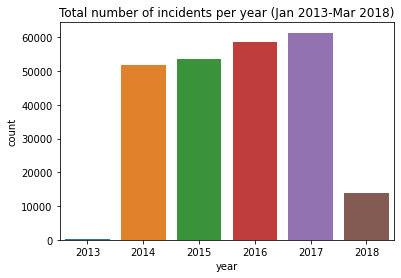

In [12]:
#plot bar graph to visualize the total number of incidents per year 
total_countplot=sns.countplot(x='year', data=df).set_title("Total number of incidents per year (Jan 2013-Mar 2018)")

 

In [13]:
#create new column for total number of casualties
df['total_casualties'] = df['n_injured'] + df['n_killed']
#sort dataframe by most serious incidents (i.e. most number of casualties) 
df.sort_values(by=['total_casualties'], ascending=False)


,date,state,n_killed,n_injured,participant_age_group,participant_gender,participant_relationship,gun_type,latitude,longitude,location_description,year,month,male_participant,female_participant,unknown_participant,total_casualties
130448,2016-06-12,Florida,50,53,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male||5...,NaN,0::223 Rem [AR-15]||1::9mm,28.5195,-81.3767,Pulse,2016,6,61,17,0,103
217151,2017-11-05,Texas,27,20,0::Teen 12-17||1::Child 0-11||2::Child 0-11||3...,0::Female||1::Female||2::Female||3::Female||4:...,NaN,0::223 Rem [AR-15]||1::Rifle||2::9mm||3::22 LR,29.2733,-98.0564,First Baptist Church,2017,11,19,23,0,47
101531,2015-12-02,California,16,19,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||3::Male||4::Male||5::Female|...,NaN,0::223 Rem [AR-15]||1::223 Rem [AR-15]||2::9mm...,34.0758,-117.2770,Inland Regional Center,2015,12,12,11,0,35
232745,2018-02-14,Florida,17,17,0::Adult 18+||1::Teen 12-17||2::Teen 12-17||3:...,0::Male||1::Male||2::Male||3::Male||4::Female|...,NaN,0::223 Rem [AR-15]||1::Handgun,26.3045,-80.2694,Marjory Stoneman Douglas High School,2018,2,17,18,0,34
70511,2015-05-17,Texas,9,18,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||1::Male||2::Male||3::Male||4::Male||5...,NaN,NaN,31.5039,-97.1290,Twin Peaks Restaurant,2015,5,9,0,0,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19426,2014-05-30,Virginia,0,0,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Male||3::Female||4::Female,NaN,NaN,38.8451,-77.0764,NaN,2014,5,1,2,0,0
70146,2015-05-15,Washington,0,0,0::Adult 18+,0::Male,NaN,NaN,47.6611,-117.4320,NaN,2015,5,1,0,0,0
70147,2015-05-15,North Carolina,0,0,0::Adult 18+,0::Male,NaN,NaN,35.2430,-81.1897,NaN,2015,5,1,0,0,0
70149,2015-05-15,Iowa,0,0,0::Teen 12-17||1::Teen 12-17||2::Teen 12-17||3...,0::Male||1::Male||2::Male||3::Male,NaN,0::9mm||1::9mm||2::40 SW||3::40 SW||4::22 LR,42.4986,-92.3149,NaN,2015,5,4,0,0,0


In [14]:
#inspect new column
df['total_casualties'].describe()

count    239677.000000
mean          0.746296
std           0.842343
min           0.000000
25%           0.000000
50%           1.000000
75%           1.000000
max         103.000000
Name: total_casualties, dtype: float64

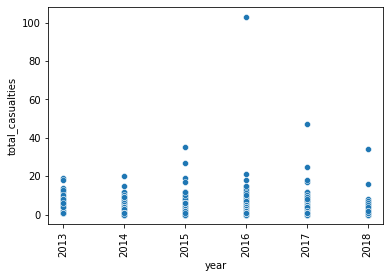

In [15]:
#Let's check for outliers for total_casualties via a scatterplot

killed_plot=sns.scatterplot(data=df, x="year", y="total_casualties")


for item in killed_plot.get_xticklabels():
    item.set_rotation(90)
    
#the outlier for 2016 data is the orlando nightclub shooting

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

2013 v.s. 2014: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.226e-201 U_stat=1.408e+07
2014 v.s. 2015: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.563e-75 U_stat=1.307e+09
2015 v.s. 2016: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.482e-07 U_stat=1.549e+09
2016 v.s. 2017: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.171e-08 U_stat=1.835e+09


(<AxesSubplot:xlabel='year', ylabel='total_casualties'>,
  <statannot.StatResult.StatResult at 0x7fb265379e50>])

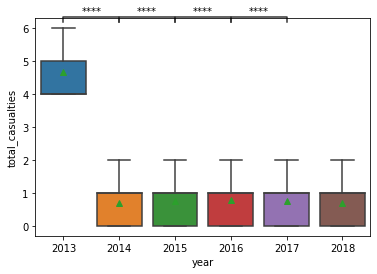

In [16]:
#now let's remove the outliers and inspect total_casualties again with a boxplot

x = "year"
y = "total_casualties"
box_casualties = sns.boxplot(data=df, x=x, y=y,showmeans=True,showfliers=False)

#adding in statistical notation to denote significance level
add_stat_annotation(box_casualties, data=df, x=x, y=y,
                    box_pairs=[(2013,2014),(2014, 2015),(2015,2016),(2016,2017)],
                    test='Mann-Whitney', text_format='star', loc='outside', verbose=2)